In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
# from torchvision.models import vgg11, VGG11_Weights
from torchvision import models

import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'

import copy

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# torch.set_default_device(device)

In [3]:
# desired size of the output image
imsize = 512 if torch.cuda.is_available() else 128  # use small size if no GPU

In [4]:
def main_function(content_img_pth, style_img_pth):
    # Define image loader
    imsize = 512 if torch.cuda.is_available() else 128
    loader = transforms.Compose([
        transforms.Resize(imsize),
        transforms.ToTensor()])

    def image_loader(image_name):
        image = Image.open(image_name)
        image = loader(image).unsqueeze(0)
        return image.to(device, torch.float)

    # Load content and style images
    content_img = image_loader(content_img_pth)
    style_img = image_loader(style_img_pth)
    content_img = content_img.to(device)
    style_img = style_img.to(device)

    assert style_img.size() == content_img.size(), "Style and content images must be of the same size"

    # Define visualization functions
    unloader = transforms.ToPILImage()
    plt.ion()

    def imshow(tensor, title=None):
        image = tensor.cpu().clone().squeeze(0)
        image = unloader(image)
        plt.imshow(image)
        if title is not None:
            plt.title(title)
        plt.pause(0.001)

    # Show content and style images
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(transforms.ToPILImage()(content_img.cpu().squeeze()))
    plt.title('Content Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(transforms.ToPILImage()(style_img.cpu().squeeze()))
    plt.title('Style Image')
    plt.axis('off')

    plt.show()

    # Define ContentLoss module
    class ContentLoss(nn.Module):
        def __init__(self, target):
            super(ContentLoss, self).__init__()
            self.target = target.detach()

        def forward(self, input):
            self.loss = F.mse_loss(input, self.target)
            return input

    # Define gram_matrix function
    def gram_matrix(input):
        a, b, c, d = input.size()
        features = input.view(a * b, c * d)
        G = torch.mm(features, features.t())
        return G.div(a * b * c * d)

    # Define StyleLoss module
    class StyleLoss(nn.Module):
        def __init__(self, target_feature):
            super(StyleLoss, self).__init__()
            self.target = gram_matrix(target_feature).detach()

        def forward(self, input):
            G = gram_matrix(input)
            self.loss = F.mse_loss(G, self.target)
            return input

    # Load pre-trained VGG model
    cnn = models.vgg19(pretrained=True).features.eval().to(device)

    # Define normalization parameters
    cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
    cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

    # Define Normalization module
    class Normalization(nn.Module):
        def __init__(self, mean, std):
            super(Normalization, self).__init__()
            self.mean = torch.tensor(mean).view(-1, 1, 1)
            self.std = torch.tensor(std).view(-1, 1, 1)

        def forward(self, img):
            return (img - self.mean) / self.std

    # Define style transfer parameters
    content_layers_default = ['conv_4']
    style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

    # Define get_style_model_and_losses function
    def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                                   style_img, content_img,
                                   content_layers=content_layers_default,
                                   style_layers=style_layers_default):
        normalization = Normalization(normalization_mean, normalization_std)
        content_losses = []
        style_losses = []
        model = nn.Sequential(normalization)
        i = 0
        for layer in cnn.children():
            if isinstance(layer, nn.Conv2d):
                i += 1
                name = 'conv_{}'.format(i)
            elif isinstance(layer, nn.ReLU):
                name = 'relu_{}'.format(i)
                layer = nn.ReLU(inplace=False)
            elif isinstance(layer, nn.MaxPool2d):
                name = 'pool_{}'.format(i)
            elif isinstance(layer, nn.BatchNorm2d):
                name = 'bn_{}'.format(i)
            else:
                raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))
            model.add_module(name, layer)
            if name in content_layers:
                target = model(content_img).detach()
                content_loss = ContentLoss(target)
                model.add_module("content_loss_{}".format(i), content_loss)
                content_losses.append(content_loss)
            if name in style_layers:
                target_feature = model(style_img).detach()
                style_loss = StyleLoss(target_feature)
                model.add_module("style_loss_{}".format(i), style_loss)
                style_losses.append(style_loss)
        for i in range(len(model) - 1, -1, -1):
            if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
                break
        model = model[:(i + 1)]
        return model, style_losses, content_losses

    # Define input optimizer
    def get_input_optimizer(input_img):
        optimizer = optim.LBFGS([input_img])
        return optimizer

    # Define run_style_transfer function
    def run_style_transfer(cnn, normalization_mean, normalization_std,
                           content_img, style_img, input_img, num_steps=300,
                           style_weight=1000000, content_weight=1):
        model, style_losses, content_losses = get_style_model_and_losses(cnn,
            normalization_mean, normalization_std, style_img, content_img)
        input_img.requires_grad_(True)
        model.eval()
        model.requires_grad_(False)
        optimizer = get_input_optimizer(input_img)
        run = [0]
        while run[0] <= num_steps:
            def closure():
                with torch.no_grad():
                    input_img.clamp_(0, 1)
                optimizer.zero_grad()
                model(input_img)
                style_score = 0
                content_score = 0
                for sl in style_losses:
                    style_score += sl.loss
                for cl in content_losses:
                    content_score += cl.loss
                style_score *= style_weight
                content_score *= content_weight
                loss = style_score + content_score
                loss.backward()
                run[0] += 1
                if run[0] % 50 == 0:
                    print("run {}:".format(run))
                    print('Style Loss : {:4f} Content Loss: {:4f}'.format(
                        style_score.item(), content_score.item()))
                    print()
                return style_score + content_score
            optimizer.step(closure)
        with torch.no_grad():
            input_img.clamp_(0, 1)
        return input_img

    # Run style transfer
    input_img = content_img.clone()
    output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                                content_img, style_img, input_img)

    # Visualize output image
    plt.figure()
    imshow(output, title='Output Image')

    plt.ioff()
    plt.show()

In [5]:
# Initialize the paths to the images
content_paths = ["/kaggle/input/sample-images/examples/content/chicago.jpg", 
                 "/kaggle/input/sample-images/examples/content/stata.jpg"]
style_paths = ["/kaggle/input/sample-images/examples/style/la_muse.jpg", 
               "/kaggle/input/sample-images/examples/style/rain_princess.jpg", 
               "/kaggle/input/sample-images/examples/style/the_scream.jpg", 
               "/kaggle/input/sample-images/examples/style/the_shipwreck_of_the_minotaur.jpg", 
               "/kaggle/input/sample-images/examples/style/udnie.jpg", 
               "/kaggle/input/sample-images/examples/style/wave.jpg"]

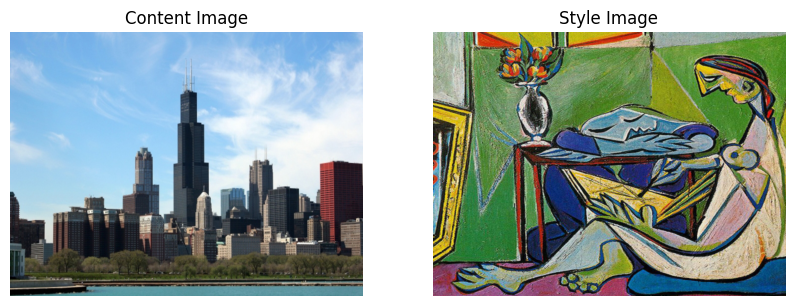

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:03<00:00, 176MB/s]
/tmp/ipykernel_26/2171398609.py:86: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than to

run [50]:
Style Loss : 220.048691 Content Loss: 35.974724

run [100]:
Style Loss : 64.669937 Content Loss: 34.543747

run [150]:
Style Loss : 27.521612 Content Loss: 33.031376

run [200]:
Style Loss : 13.481199 Content Loss: 30.906872

run [250]:
Style Loss : 8.189714 Content Loss: 28.724606

run [300]:
Style Loss : 5.941720 Content Loss: 26.829552



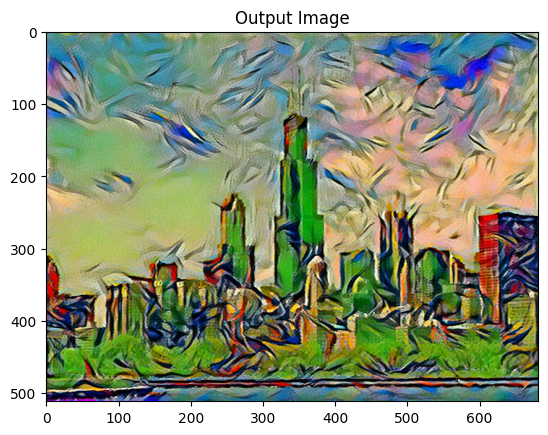


 ==================*****==================== 



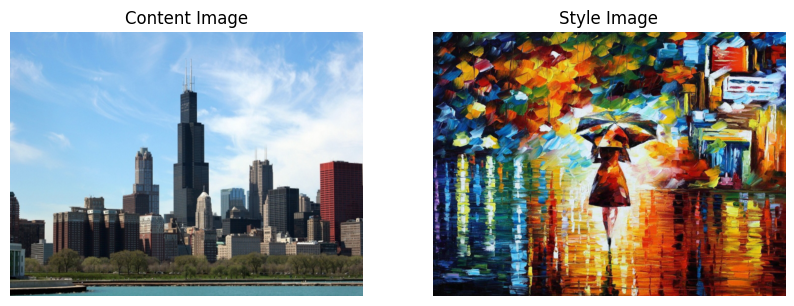

run [50]:
Style Loss : 298.912964 Content Loss: 28.352619

run [100]:
Style Loss : 101.258018 Content Loss: 28.543095

run [150]:
Style Loss : 44.364594 Content Loss: 28.483723

run [200]:
Style Loss : 25.462778 Content Loss: 27.075180

run [250]:
Style Loss : 17.572763 Content Loss: 25.492067

run [300]:
Style Loss : 12.920413 Content Loss: 23.944689



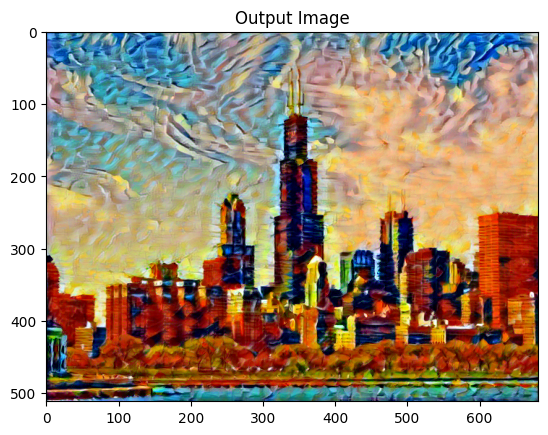


 ==================*****==================== 



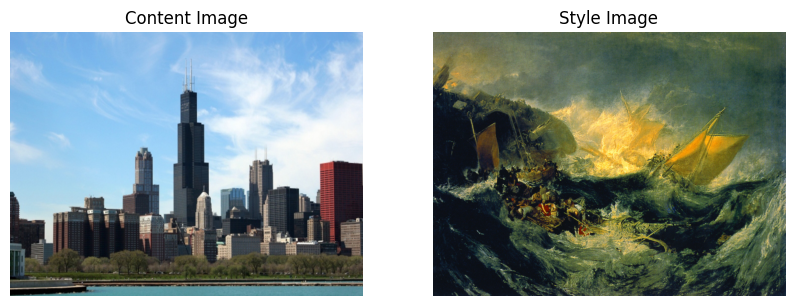

run [50]:
Style Loss : 82.028908 Content Loss: 12.078111

run [100]:
Style Loss : 42.632915 Content Loss: 10.421876

run [150]:
Style Loss : 22.043339 Content Loss: 9.420016

run [200]:
Style Loss : 11.153269 Content Loss: 8.651833

run [250]:
Style Loss : 5.304893 Content Loss: 7.782775

run [300]:
Style Loss : 2.558174 Content Loss: 7.096177



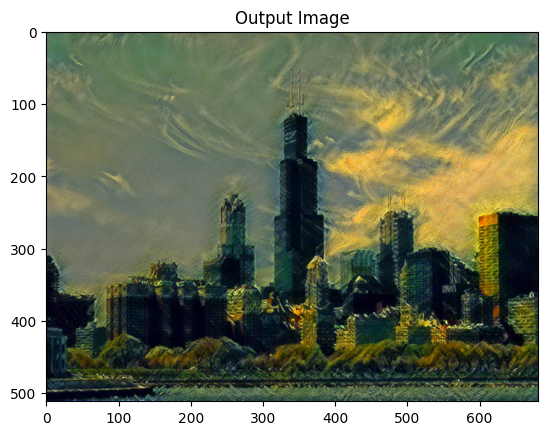


 ==================*****==================== 



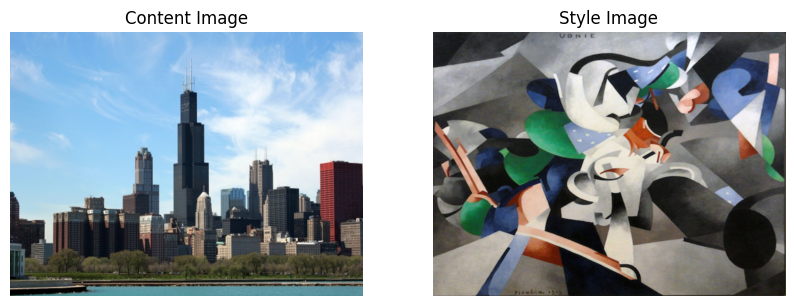

run [50]:
Style Loss : 55.258457 Content Loss: 8.471175

run [100]:
Style Loss : 25.587387 Content Loss: 8.862784

run [150]:
Style Loss : 12.710777 Content Loss: 8.463698

run [200]:
Style Loss : 7.166727 Content Loss: 7.849449

run [250]:
Style Loss : 4.316242 Content Loss: 7.485339

run [300]:
Style Loss : 2.996042 Content Loss: 7.058517



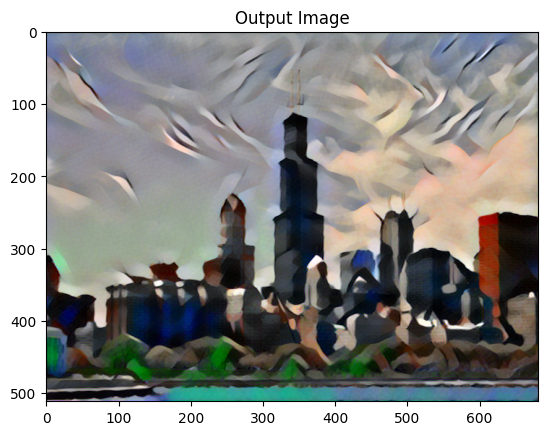


 ==================*****==================== 



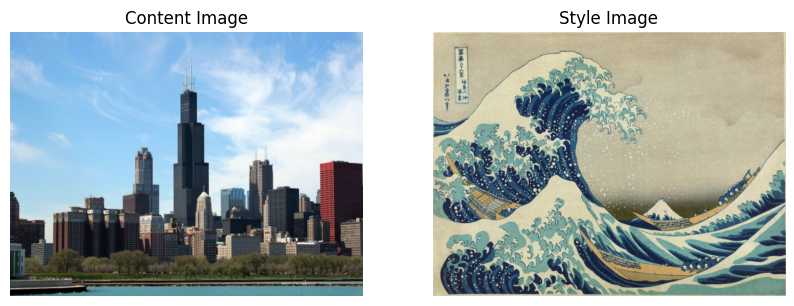

run [50]:
Style Loss : 98.367455 Content Loss: 24.382109

run [100]:
Style Loss : 22.285425 Content Loss: 22.756935

run [150]:
Style Loss : 7.075553 Content Loss: 20.576336

run [200]:
Style Loss : 3.689858 Content Loss: 18.366749

run [250]:
Style Loss : 2.589375 Content Loss: 16.517309

run [300]:
Style Loss : 2.009500 Content Loss: 15.120733



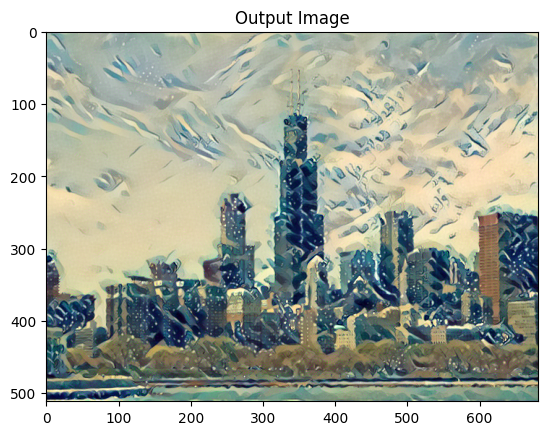


 ==================*****==================== 



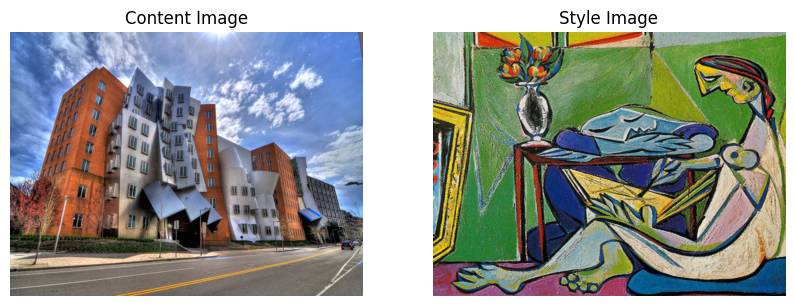

run [50]:
Style Loss : 125.821419 Content Loss: 34.271847

run [100]:
Style Loss : 32.716869 Content Loss: 32.068176

run [150]:
Style Loss : 13.966282 Content Loss: 28.442081

run [200]:
Style Loss : 7.924326 Content Loss: 24.856552

run [250]:
Style Loss : 4.968454 Content Loss: 21.803288

run [300]:
Style Loss : 3.333275 Content Loss: 19.691166



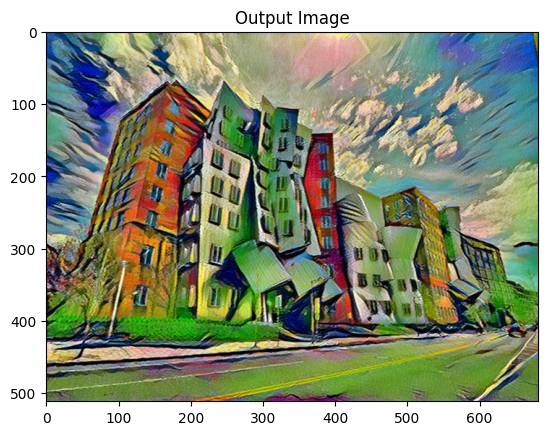


 ==================*****==================== 



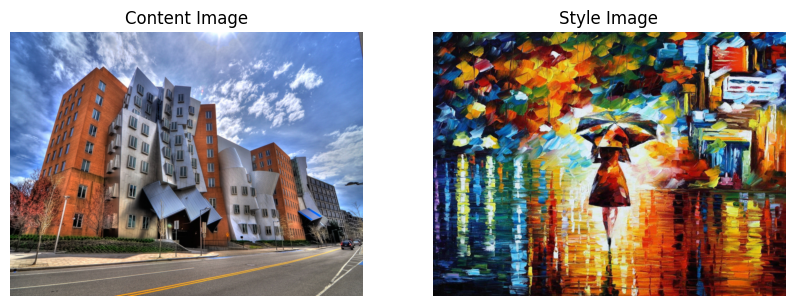

run [50]:
Style Loss : 333.025330 Content Loss: 37.591091

run [100]:
Style Loss : 85.027748 Content Loss: 35.348190

run [150]:
Style Loss : 38.325230 Content Loss: 32.244854

run [200]:
Style Loss : 24.392069 Content Loss: 28.367880

run [250]:
Style Loss : 16.749006 Content Loss: 24.715313

run [300]:
Style Loss : 12.076288 Content Loss: 21.798159



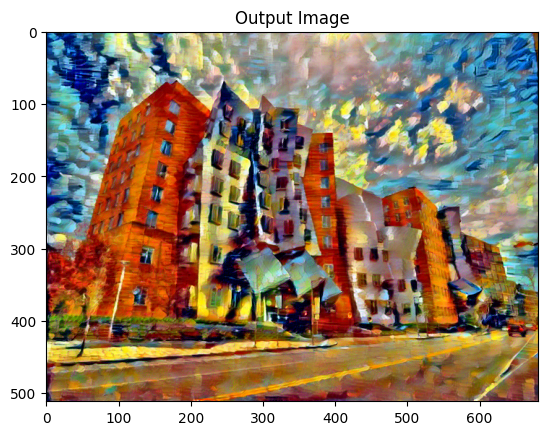


 ==================*****==================== 



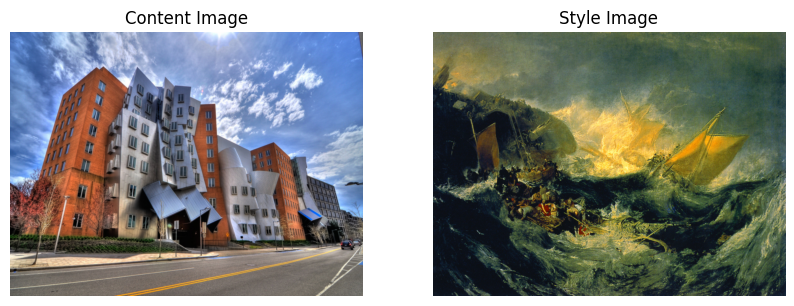

run [50]:
Style Loss : 50.031685 Content Loss: 14.301785

run [100]:
Style Loss : 30.048506 Content Loss: 11.497641

run [150]:
Style Loss : 19.452908 Content Loss: 10.730608

run [200]:
Style Loss : 12.001418 Content Loss: 9.660789

run [250]:
Style Loss : 21.642570 Content Loss: 9.530864

run [300]:
Style Loss : 3.626088 Content Loss: 7.942855



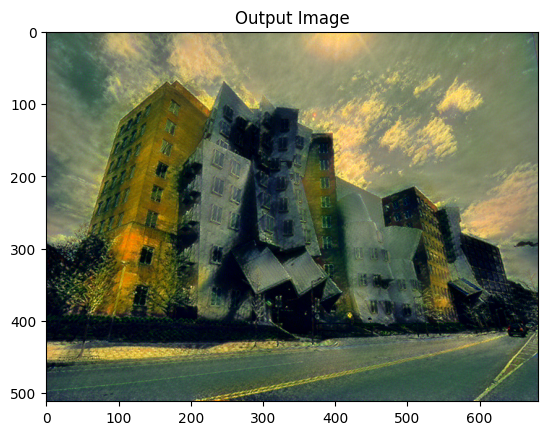


 ==================*****==================== 



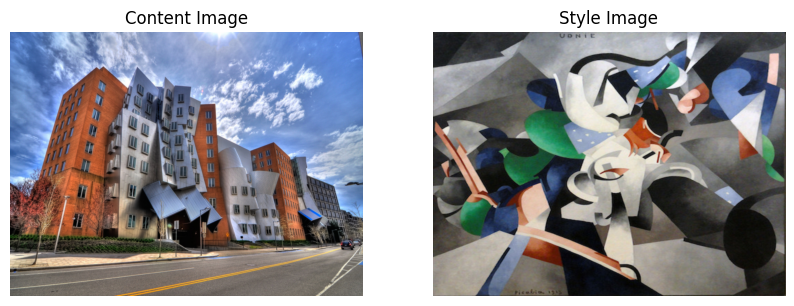

run [50]:
Style Loss : 27.872622 Content Loss: 10.093980

run [100]:
Style Loss : 13.892565 Content Loss: 9.174006

run [150]:
Style Loss : 8.112118 Content Loss: 8.657020

run [200]:
Style Loss : 5.592031 Content Loss: 7.908218

run [250]:
Style Loss : 3.795486 Content Loss: 7.514660

run [300]:
Style Loss : 2.664634 Content Loss: 7.194796



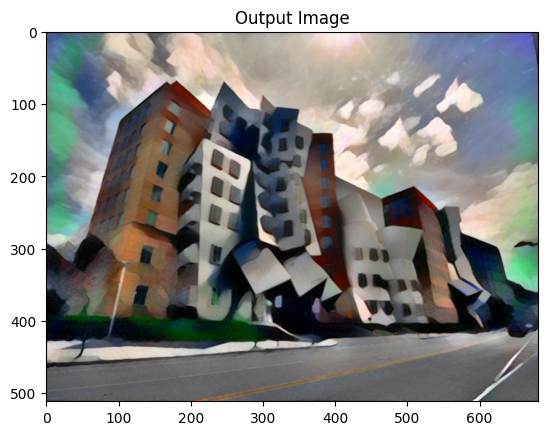


 ==================*****==================== 



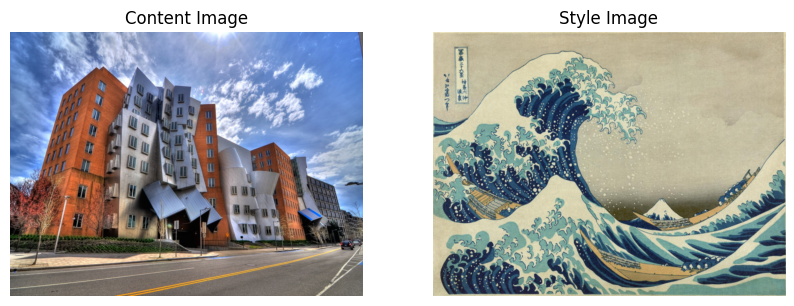

run [50]:
Style Loss : 41.098869 Content Loss: 12.765317

run [100]:
Style Loss : 18.020401 Content Loss: 11.971382

run [150]:
Style Loss : 10.850848 Content Loss: 10.984252

run [200]:
Style Loss : 7.235738 Content Loss: 10.098751

run [250]:
Style Loss : 4.885630 Content Loss: 9.488701

run [300]:
Style Loss : 3.354357 Content Loss: 8.996225



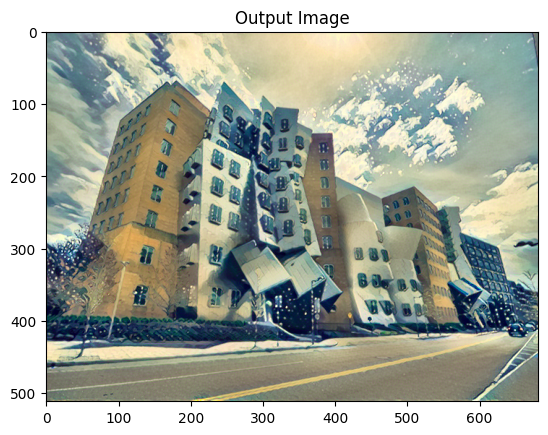


 ==================*****==================== 



In [6]:
for content_path in content_paths:
    for style_path in style_paths: 
        loader = transforms.Compose([
            transforms.Resize(imsize),
            transforms.ToTensor()])
        def image_loader(image_name):
            image = Image.open(image_name)
            image = loader(image).unsqueeze(0)
            return image.to(device, torch.float)
    
        content_img = image_loader(content_path)
        style_img = image_loader(style_path)
        content_img = content_img.to(device)
        style_img = style_img.to(device)
        
        if(content_img.size() == style_img.size()):
            main_function(content_path, style_path)
            print("\n ==================*****==================== \n")
        else:
            pass